In [1]:
import geopandas as gpd
import pandas as pd

In [2]:
from shapely import from_wkt

def combine_districts_and_census_areas(df, district_column='codi_districte', census_column='codi_seccio_censal'):
    """Combines districts and census areas into a single column, `Seccio_Censal`."""
    df["Seccio_Censal"] = (
        (df[district_column] * 1000 ) + df[census_column]
    )

def barcelona_census_areas(url="BarcelonaCiutat_SeccionsCensals.csv"):
    """This loads the census areas as defined in a CSV file, and returns a 
    GDF with a single `Seccio_Censal` column and associated geometry.
    
    This CSV file is taken from 
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/20170706-districtes-barris/resource/e16856a7-b3c0-4c32-a468-cc190cbbf7a9
    where it is described as "Detail of administrative units of the city of Barcelona : districts, neighbourhoods, Interés area, basic statistical areas (AEB) and census areas"

    The `Seccio_Censal` column is the combination of the `codi_districte` and `codi_seccio_censal`. Many other datasets
    use this as the join key and it appears to be the combination of the district and census area columns.
    
    """
    url = "BarcelonaCiutat_SeccionsCensals.csv"
    df = pd.read_csv(url)
    combine_districts_and_census_areas(df)
    
    df["geometry"] = df["geometria_wgs84"].apply(from_wkt)
    df = df[["Seccio_Censal","geometry"]]
    assert df["Seccio_Censal"].is_unique
    df.set_index("Seccio_Censal")
    return gpd.GeoDataFrame(df,geometry="geometry",crs="EPSG:4326")


In [3]:
census_areas_gdf = barcelona_census_areas()

In [4]:
census_areas_gdf

,Seccio_Censal,geometry
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ..."
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2...."
2,1003,"POLYGON ((2.1722 41.37692, 2.17206 41.37696, 2..."
3,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ..."
4,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2..."
...,...,...
1063,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ..."
1064,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ..."
1065,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2...."
1066,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ..."


In [5]:
census_areas_gdf.explore("Seccio_Censal")

In [6]:
def load_population_dataset(census_areas_gdf, year):
    """Load population of Barcelona for a particular year, and match to census area. Returns a GDF.
    
    This is based on "Population of Barcelona according to the Municipal Register of Inhabitants on January 1 of each year"
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/pad_mdbas/resource/eb82adf2-a7b0-40e6-9624-b4b9eff23018.

    It is assumed data is kept locally in a CSV prefixed by year.
    """
    df = pd.read_csv(f"{year}_pad_mdbas.csv")
    df["population"] = df["Valor"].astype(float)
    df = df[["population","Seccio_Censal"]]
    df.set_index("Seccio_Censal")
    return census_areas_gdf.merge(df)

In [7]:
population_gdf = load_population_dataset(census_areas_gdf, 2023)
population_gdf

,Seccio_Censal,geometry,population
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ...",1246.0
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2....",1238.0
2,1003,"POLYGON ((2.1722 41.37692, 2.17206 41.37696, 2...",3406.0
3,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ...",2881.0
4,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2...",2294.0
...,...,...,...
1063,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ...",1802.0
1064,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ...",1742.0
1065,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2....",1304.0
1066,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ...",1568.0


In [8]:
population_gdf.explore("population", scheme="percentiles")

In [9]:
def load_income_dataset(census_areas_gdf, year):
    """Load income of Barcelona for a particular year, and match to census area. Returns a GDF.

    This is based on "Average gross taxable income per person (€) in the city of Barcelona based 
    on Atlas de distribución de la renta de los hogares of Instituto Nacional de Estadística (INE)"
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/atles-renda-bruta-per-persona/resource/e6cabd96-68d6-451b-bc9f-c2a381d733e6

    It is assumed data is kept locally in a CSV prefixed by year.
    """
    df = pd.read_csv(f"{year}_atles_renda_bruta_persona.csv")
    df["income"] = df["Import_Renda_Bruta_€"].astype(float)
    combine_districts_and_census_areas(df, district_column='Codi_Districte',census_column='Seccio_Censal')
    
    df = df[["income","Seccio_Censal"]]
    df.set_index("Seccio_Censal")
    return census_areas_gdf.merge(df, on="Seccio_Censal")

In [10]:
income_gdf = load_income_dataset(census_areas_gdf, 2023)
income_gdf

,Seccio_Censal,geometry,income
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ...",17113.0
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2....",13081.0
2,1003,"POLYGON ((2.1722 41.37692, 2.17206 41.37696, 2...",12707.0
3,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ...",16040.0
4,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2...",13549.0
...,...,...,...
1063,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ...",16307.0
1064,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ...",21767.0
1065,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2....",19098.0
1066,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ...",19360.0


In [11]:
income_gdf.explore("income")

In [12]:
import seaborn as sns

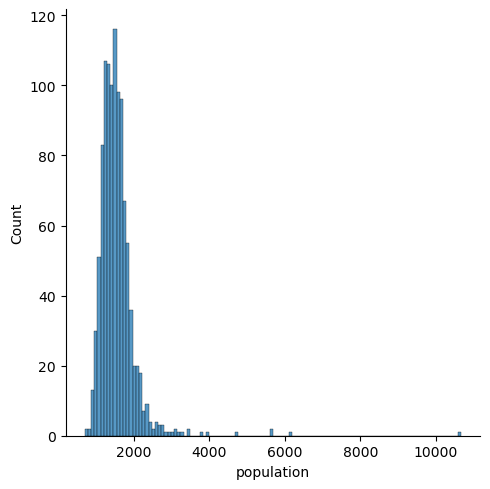

In [13]:
sns.displot(population_gdf["population"])

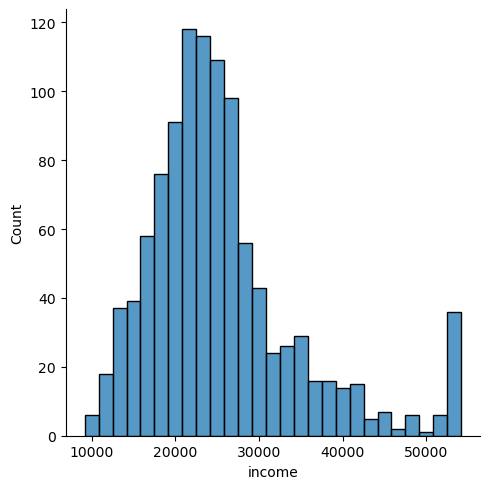

In [14]:
sns.displot(income_gdf["income"])

In [15]:
def std_dev(gdf, column):
    std_gdf = gdf.copy(deep=True)
    
    std_gdf[f"{column}_std"] = (
        std_gdf[column] - std_gdf[column].mean()
    ) / std_gdf[column].std()

    return std_gdf

<Axes: xlabel='population_std', ylabel='Count'>

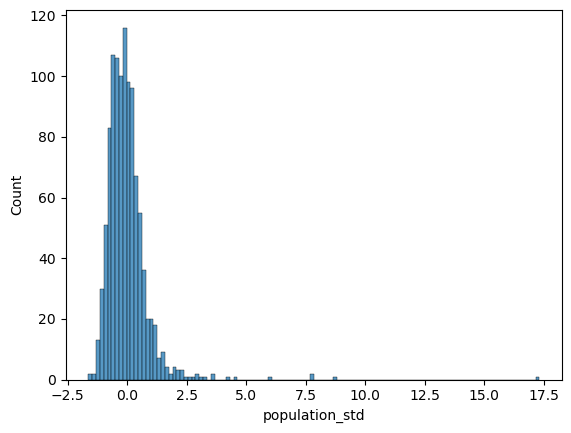

In [16]:
sns.histplot(data=std_dev(population_gdf, "population"), x='population_std')

In [17]:
std_dev(population_gdf, "population").explore("population_std")

In [18]:
def filter_extremes(gdf, column, max_abs_std=3):
    std_gdf = std_dev(gdf, column)
    std_column = f"{column}_std"
    std_gdf = std_gdf[
        (std_gdf[std_column] >= (-1 * max_abs_std))
        & (std_gdf[std_column] < max_abs_std)
    ]
    return std_gdf

<Axes: xlabel='population_std', ylabel='Count'>

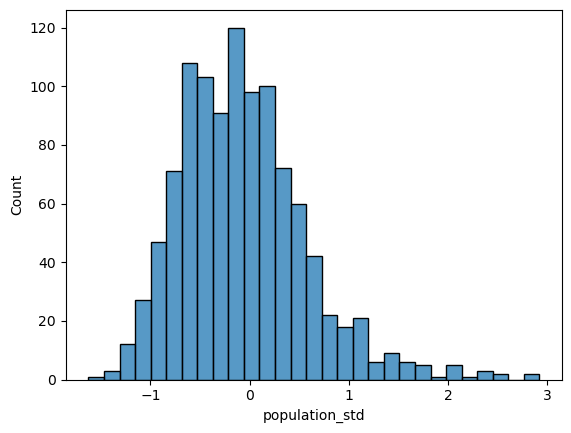

In [19]:
sns.histplot(data=filter_extremes(population_gdf, "population"), x='population_std')

In [20]:
import esda
import matplotlib.pyplot as plt
from libpysal import graph

def moran_global(gdf, column):
    contiguity = graph.Graph.build_contiguity(gdf, rook=False)
    contiguity_r = contiguity.transform("r")
    
    moran = esda.Moran(gdf[column], contiguity_r)
    print(f"I: {moran.I}, P_sim: {moran.p_sim}")

    visualise_df = gdf.copy(deep=True)[[column]]
    lag_column = f"{column}_lag"
    visualise_df[lag_column] = contiguity_r.lag(visualise_df[column])

    f, ax = plt.subplots(1, figsize=(6, 6))
    sns.regplot(
        x=column,
        y=lag_column,
        data=visualise_df,
        marker=".",
        scatter_kws={"alpha": 0.2},
        line_kws=dict(color="lightcoral")
    )
    ax.set_aspect('equal')
    plt.axvline(0, c="black", alpha=0.5)
    plt.axhline(0, c="black", alpha=0.5)

I: 0.20764721905715122, P_sim: 0.001


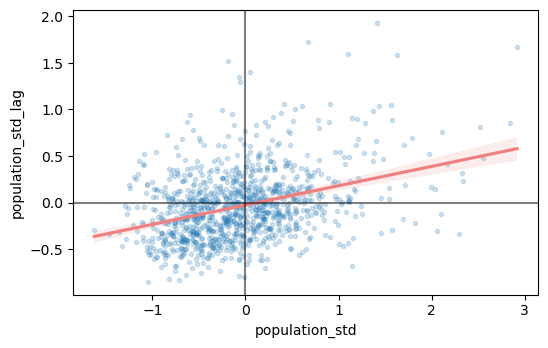

In [21]:
moran_global(filter_extremes(population_gdf, "population"), "population_std")

In [22]:
from libpysal import graph

def moran_local_clusters(gdf, column):
    contiguity = graph.Graph.build_contiguity(gdf, rook=False)
    contiguity_r = contiguity.transform("r")
    
    lisa_gdf = gdf.copy(deep=True)
    lisa = esda.Moran_Local(lisa_gdf[column], contiguity_r)

    crit_value=0.05
    lisa_gdf['cluster'] = lisa.get_cluster_labels(crit_value=crit_value)
    return lisa.explore(
        lisa_gdf,
        crit_value=crit_value,
        prefer_canvas=True,
        tiles="CartoDB Positron",
    )

In [23]:
moran_local_clusters(filter_extremes(population_gdf, "population"), "population_std")

I: 0.8052384758998123, P_sim: 0.001


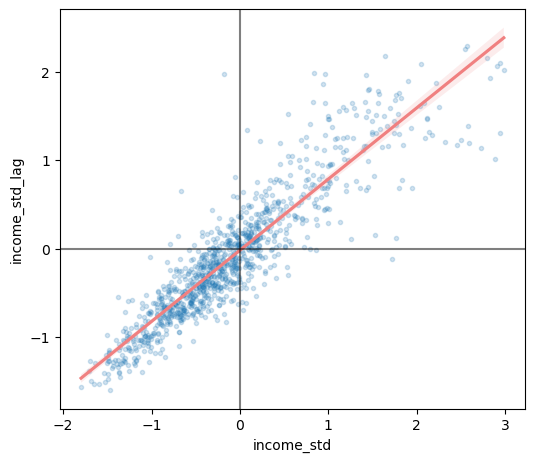

In [24]:
moran_global(filter_extremes(income_gdf, "income"), "income_std")

In [25]:
moran_local_clusters(filter_extremes(income_gdf, "income"), "income_std")

In [26]:
import tobler

census_areas_grid_gdf = tobler.util.h3fy(census_areas_gdf, resolution=9)
census_areas_grid_gdf

,geometry
hex_id,
893944600c7ffff,"POLYGON ((2.129 41.40356, 2.13084 41.40477, 2...."
8939446352bffff,"POLYGON ((2.08326 41.42735, 2.08293 41.42913, ..."
89394460e67ffff,"POLYGON ((2.19047 41.38409, 2.19015 41.38586, ..."
8939446017bffff,"POLYGON ((2.16494 41.39924, 2.16461 41.40101, ..."
89394461c07ffff,"POLYGON ((2.14644 41.36516, 2.14829 41.36637, ..."
...,...
89394461b8bffff,"POLYGON ((2.17025 41.33692, 2.17242 41.33635, ..."
893944619d7ffff,"POLYGON ((2.17901 41.35663, 2.18085 41.35783, ..."
893944619cbffff,"POLYGON ((2.17381 41.35122, 2.17598 41.35065, ..."


In [27]:
m = census_areas_gdf.explore(tiles="CartoDB Positron")
census_areas_grid_gdf.explore(m=m, color="red")

In [28]:
barcelona_crs = "EPSG:25831" # ETRS89 / UTM zone 31N
interpolated_income_gdf = tobler.area_weighted.area_interpolate(
    source_df=income_gdf.to_crs(barcelona_crs),
    target_df=census_areas_grid_gdf.to_crs(barcelona_crs),
    extensive_variables=[],
    intensive_variables=["income"],
)
interpolated_income_gdf.head(2)

,income,geometry
hex_id,,
893944600c7ffff,54175.001615,"POLYGON ((427196.023 4583924.062, 427351.374 4..."
8939446352bffff,23931.000000,"POLYGON ((423400.197 4586604.058, 423374.683 4..."


In [29]:
interpolated_income_gdf.explore("income", tiles="CartoDB Positron")

In [30]:
interpolated_population_gdf = tobler.area_weighted.area_interpolate(
    source_df=population_gdf.to_crs(barcelona_crs),
    target_df=census_areas_grid_gdf.to_crs(barcelona_crs),
    extensive_variables=["population"],
    intensive_variables=[],
)
interpolated_population_gdf.head(2)

,population,geometry
hex_id,,
893944600c7ffff,812.183572,"POLYGON ((427196.023 4583924.062, 427351.374 4..."
8939446352bffff,25.649150,"POLYGON ((423400.197 4586604.058, 423374.683 4..."


In [31]:
interpolated_population_gdf.explore("population", tiles="CartoDB Positron")

I: 0.8155651452142023, P_sim: 0.001


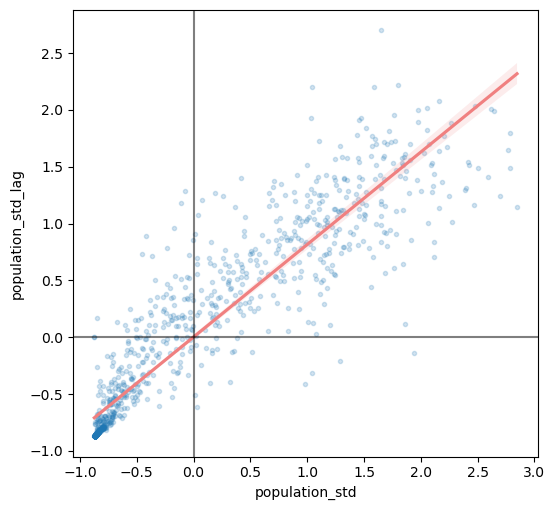

In [32]:
moran_global(filter_extremes(interpolated_population_gdf, "population"), "population_std")

In [33]:
moran_local_clusters(filter_extremes(interpolated_population_gdf, "population"), "population_std")

/Users/mxm/Code/mine/geo_course/spatial-data-science-in-python-mikemoraned/.pixi/envs/default/lib/python3.12/site-packages/esda/moran.py:1351: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [34]:
import tobler
from libpysal import graph

def build_safe_grid(gdf, resolution):
    """Builds a safe H3 grid, where safe means it has no isolates.

    Some later operations don't work if we have isolates (areas with no nieghhours), so we exclude them here.
    """
    initial_grid_gdf = tobler.util.h3fy(gdf, resolution=resolution)
    
    contiguity = graph.Graph.build_contiguity(initial_grid_gdf, rook=False)
    
    # join back to original GDF and filter out any isolates
    cardinalities = contiguity.cardinalities
    cardinalities.name='cardinalities'
    joined_gdf = initial_grid_gdf.join(cardinalities)
    filtered_grid_gdf = (
        joined_gdf[joined_gdf['cardinalities'] != 0]
            .drop('cardinalities', axis=1)
            .copy(deep=True)
    )
    return filtered_grid_gdf


In [35]:
census_areas_grid_gdf = build_safe_grid(census_areas_gdf, resolution=9)
census_areas_grid_gdf

,geometry
hex_id,
893944600c7ffff,"POLYGON ((2.129 41.40356, 2.13084 41.40477, 2...."
8939446352bffff,"POLYGON ((2.08326 41.42735, 2.08293 41.42913, ..."
89394460e67ffff,"POLYGON ((2.19047 41.38409, 2.19015 41.38586, ..."
8939446017bffff,"POLYGON ((2.16494 41.39924, 2.16461 41.40101, ..."
89394461c07ffff,"POLYGON ((2.14644 41.36516, 2.14829 41.36637, ..."
...,...
893944619c3ffff,"POLYGON ((2.17901 41.35663, 2.17684 41.3572, 2..."
89394461827ffff,"POLYGON ((2.1723 41.34823, 2.17447 41.34766, 2..."
893944619d7ffff,"POLYGON ((2.17901 41.35663, 2.18085 41.35783, ..."


In [36]:
census_areas_grid_gdf.explore()

In [37]:
interpolated_income_gdf = tobler.area_weighted.area_interpolate(
    source_df=income_gdf.to_crs(barcelona_crs),
    target_df=census_areas_grid_gdf.to_crs(barcelona_crs),
    extensive_variables=[],
    intensive_variables=["income"],
)
interpolated_income_gdf.explore("income")

I: 0.9403212329834735, P_sim: 0.001


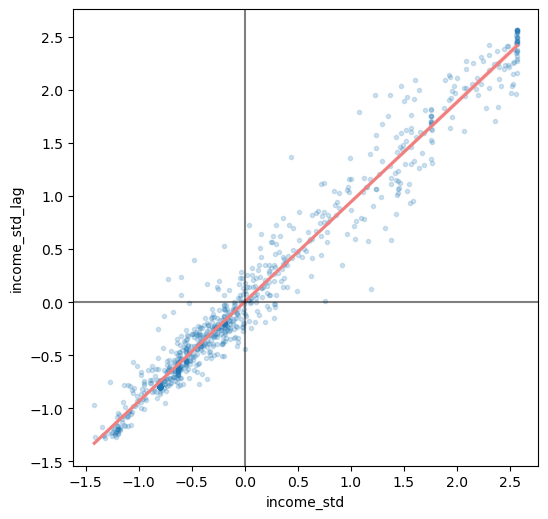

In [38]:
moran_global(filter_extremes(interpolated_income_gdf, "income"), "income_std")

In [39]:
moran_local_clusters(filter_extremes(interpolated_income_gdf, "income"), "income_std")

In [40]:
interpolated_population_gdf = tobler.area_weighted.area_interpolate(
    source_df=population_gdf.to_crs(barcelona_crs),
    target_df=census_areas_grid_gdf.to_crs(barcelona_crs),
    extensive_variables=["population"],
    intensive_variables=[],
)
interpolated_population_gdf.explore("population")

I: 0.8151894093622861, P_sim: 0.001


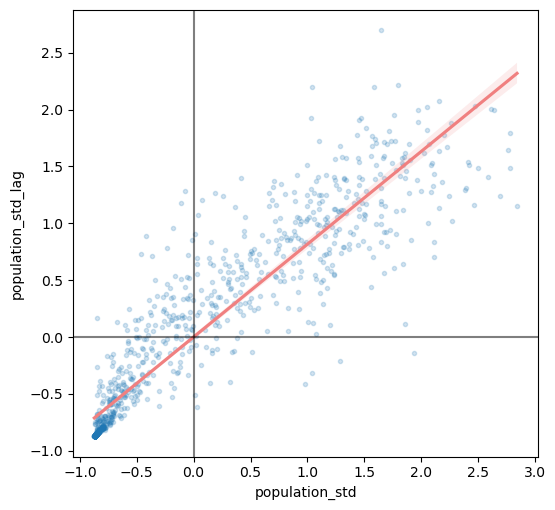

In [41]:
moran_global(filter_extremes(interpolated_population_gdf, "population"), "population_std")

In [42]:
moran_local_clusters(filter_extremes(interpolated_population_gdf, "population"), "population_std")

In [43]:
interpolated_population_gdf.crs

<Projected CRS: EPSG:25831>
Name: ETRS89 / UTM zone 31N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 0°E and 6°E: Andorra; Denmark - offshore; Germany - offshore; Jan Mayen - offshore; Norway including Svalbard - onshore and offshore; Spain - mainland and Balearic islands - onshore and offshore.
- bounds: (0.0, 37.0, 6.01, 82.45)
Coordinate Operation:
- name: UTM zone 31N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich